<a href="https://colab.research.google.com/github/Kag-Bar/Triple_View_Motion_Detection/blob/main/Movement_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Insert path to the images folder into** `test_folder_path`.



*   The folder should hold 3 jpeg type images named '*before*', '*after0*', and '*after1*'
*   Provide the absolute path (use '/' before the path)
*   Connect the the Google Colab GPU



In [12]:
test_folder_path = None

# Import and installtions

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
!pip install timm torch torchvision

In [2]:
!git clone --recursive https://github.com/naver/mast3r
%cd mast3r

fatal: destination path 'mast3r' already exists and is not an empty directory.
/content/mast3r


In [3]:
!pip install torch torchvision pytorch-cuda=12.1 -c pytorch -c nvidia
!pip install -r requirements.txt
!pip install -r dust3r/requirements.txt
!pip install -r dust3r/requirements_optional.txt

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'pytorch'


In [4]:
!mkdir -p checkpoints/
!wget https://download.europe.naverlabs.com/ComputerVision/MASt3R/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric.pth -P checkpoints/


--2024-12-24 10:54:11--  https://download.europe.naverlabs.com/ComputerVision/MASt3R/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric.pth
Resolving download.europe.naverlabs.com (download.europe.naverlabs.com)... 110.234.56.25
Connecting to download.europe.naverlabs.com (download.europe.naverlabs.com)|110.234.56.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2754910614 (2.6G)
Saving to: ‘checkpoints/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric.pth.1’

MASt3R_ViTLarge_Bas 100%[===================>]   2.57G  28.3MB/s    in 98s     

2024-12-24 10:55:49 (26.8 MB/s) - ‘checkpoints/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric.pth.1’ saved [2754910614/2754910614]



In [5]:
import cv2
import os
import json
import torch
import timm
import torchvision.transforms as T
import torch.nn.functional as F

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops

%matplotlib inline

In [6]:
from mast3r.model import AsymmetricMASt3R
from mast3r.fast_nn import fast_reciprocal_NNs, extract_correspondences_nonsym

import mast3r.utils.path_to_dust3r
from dust3r.inference import inference
from dust3r.utils.image import load_images

Warning, cannot find cuda-compiled version of RoPE2D, using a slow pytorch version instead


# Model initialization

In [7]:
class MOVEMENT_DETECTION:
  def __init__(self, detection_model_name, registration_model_name, input_size=224, patch_size=8, device='cuda'):
    ''' Detect movement of an object between a base view ('before') and two other views ('after0' and 'after1')
    Methodology based on 2 stages - object detection and registration for macthing point count.
    Model expects scenes names to be consistent - before, after0, after1'''

    self.device = device
    self.input_size = input_size
    self.patch_size = patch_size
    self.num_patches = int(self.input_size/self.patch_size)

    # Load DINO ViT-B/8 pre-trained model
    self.det_model = timm.create_model(detection_model_name, pretrained=True)
    self.det_model.eval()

    # Loading Mast3r registration model
    self.reg_model = AsymmetricMASt3R.from_pretrained(registration_model_name).to(self.device)

  def initialize(self):
    ''' Initialize the class views dict '''
    self.views = {}

  def load_scenes(self, images_folder_path, norm=True, plot_attn=False, plot_ROI=False, padding=30):
    ''' Loads the 3 scenes and extract the object ROI using DINO model.
    Saves the following in the 'self.views' dict under each scene name:
      1. image_path (str)
      2. image (np.array- W, H, C)
      3. cropped_img (np.array- W, H, C)
      4. cropped_object_coords (list[ints] - x_min, y_min, x_max, y_max)
    Takes as input:
      1. images_folder_path (str) - contain the path to the 3 scenes images
      2. norm (bool) - if to normalize the image or not pre-detection
      3. plot_attn (bool) - if to plot the entire image attention map
      4. plot_ROI (bool) - if to plot the object's ROI attention map
      5. padding (int) - the padding to the object crop
    '''
    self.initialize()
    for scene in ['before', 'after0', 'after1']:
      image_path = os.path.join('/',images_folder_path, f'{scene}.jpeg')

      self.views[scene] = {}
      self.views[scene]['image_path'] = image_path
      self.views[scene]['image'] = cv2.imread(image_path)

      img_transformed = self.transform_input(self.views[scene]['image'], norm=norm)
      cls_token, attn_map = self.run_dino(img_transformed)

      self.views[scene]['cls_token'] = cls_token

      cls_attn = self.cls_attention(scene, attn_map, plot_attn=plot_attn)
      cropped_img, cropped_object_coords = self.crop_ROI(scene, cls_attn, plot_ROI=plot_ROI, padding=padding)

      self.views[scene]['cropped_img'] = cropped_img
      self.views[scene]['cropped_object_coords'] = cropped_object_coords

  def transform_input(self, image, norm=True):
    ''' Preprocess stage for the DINO expected input.
    Inputs:
      1. image (np.ndarray) - the image array to be inserted to DINO
      2. norm (bool) - if to normalize the image or not pre-detection
    Output:
      img_transformed (torch.Tensor)- the preprocessed image
    '''
    # Convert cv2 image (BGR format) to PIL Image in RGB format
    if isinstance(image, np.ndarray):
        image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    transform = [
        T.Resize((self.input_size, self.input_size)),
        T.ToTensor(),
    ]
    if norm: # Standard RGB normalization
        transform.append(T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]))

    transform = T.Compose(transform)
    img_transformed = transform(image).unsqueeze(0)

    return img_transformed

  def run_dino(self, img_transformed):
    ''' Runs DINO on an image.
    Inputs:
      1. img_transformed (torch.Tensor) - image Tensor [1, 3, 224, 224] = [batch, C, W, H]
    Output:
      output (torch.Tensor) - DINO's output [CLS] token [1,768] = [batch, D_attn]
      attention_maps[0] (torch.Tensor) - the attention map representation of the [CLS] [1, 785, 768] = [batch, #patches+[CLS], D_attn]
    '''
    attention_maps = []

    def hook_fn(module, input, output):
      # Captures the attention outputs during the forward pass
      attention_maps.append(output)

    self.det_model.blocks[-1].attn.register_forward_hook(hook_fn)
    output = self.det_model(img_transformed)

    return output, attention_maps[0]

  def cls_attention(self, scene, attn_map, plot_attn=True):
    ''' Generates and optionally visualizes the interpolated attention map from the [CLS] token.
    Inputs:
      1. scene (str) - the scene to be analyzed
      2. attn_map (torch.Tensor) - the attention map representation of the [CLS] [1, 785, 768] = [batch, #patches+[CLS], D_attn]
      3. plot_attn (bool) - if to plot the entire image attention map
    Outputs:
      1. cls_attn (np.ndarray) - the interpolated [CLS] token attantion map back into the original image size (W,H)
      '''
    cls_attn = attn_map[:, 1:, 0].mean(dim=0)  # Average over heads, exclude CLS-to-CLS
    cls_attn = cls_attn.view(self.num_patches, self.num_patches).detach().cpu().numpy() # swtch to NxN map
    cls_attn = (cls_attn - np.min(cls_attn)) / (np.max(cls_attn) - np.min(cls_attn)) # Normalize values

    # resizes the attention map to match the resolution of the original image
    cls_attn = F.interpolate(
        torch.tensor(cls_attn).unsqueeze(0).unsqueeze(0),
        size=(self.views[scene]['image'].shape[0], self.views[scene]['image'].shape[1]),  # Image resolution
        mode="bilinear",
        align_corners=False
    ).squeeze().numpy()

    # Visualize the attention map
    if plot_attn:
      plt.figure()
      plt.imshow(self.views[scene]['image'])
      im = plt.imshow(cls_attn, cmap="jet", alpha=0.5)  # Overlay attention on image
      plt.colorbar(im)
      plt.title(scene.title())
      plt.show()

    return cls_attn

  def crop_ROI(self, scene, cls_attn, threshold_value=0.33, relative_size=0.25, padding = 10, plot_ROI=False):
    ''' Extract the object ROI in the image given a [CLS] token attantion map
    Inputs:
      1. scene (str) - the scene to be analyzed
      2. cls_attn (torch.Tensor) - the [CLS] token attention map ()
      3. threshold_value (float) - the attantion value which dictates an object of intrest extracted from the DINO model
      4. relative_size (float) - what is the minimum proportion of a potential object of interest should be compared to the largest in the image
      5. padding (int) - pixel padding added to the ROI
      6. plot_ROI (bool) - if to plot the extracted ROI or not
    Outputs:
      1. cropped_img (np.ndarray) - the cropped object ROI
      2. [minr, minc, maxr, maxc] (list[ints]) - a list of the ROI coordinates x_min, y_min, x_max, y_max
    '''

    # Threshold the attention to find the object of interest based on attention score
    binary_mask = cls_attn < threshold_value
    labeled_regions, num_labels = label(binary_mask, connectivity=2, return_num=True)
    regions = regionprops(labeled_regions)
    largest_region = max(regions, key=lambda region: region.area)
    largest_size = largest_region.area
    filtered_regions = [region for region in regions if region.area >= relative_size * largest_size] # remove noise

    # Create a binary mask with only the remaining valid regions
    final_mask = np.isin(labeled_regions, [region.label for region in filtered_regions])
    final_mask = final_mask.astype(np.uint8)

    # Obtain Object ROI
    minr, minc = np.min(np.where(final_mask == 1), axis=1)
    maxr, maxc = np.max(np.where(final_mask == 1), axis=1)

    minr = max(0, minr - padding)
    minc = max(0, minc - padding)
    maxr = min(cls_attn.shape[0], maxr + padding)
    maxc = min(cls_attn.shape[1], maxc + padding)

    cropped_cls_attn = cls_attn[minr-padding:maxr+padding, minc-padding:maxc+padding]
    cropped_img = np.array(self.views[scene]['image'])[minr-padding:maxr+padding, minc-padding:maxc+padding]

    # Visualization of the ROI
    if plot_ROI:
      plt.figure()
      plt.imshow(cropped_img)
      im = plt.imshow(cropped_cls_attn, cmap="jet", alpha=0.5)  # Overlay attention on image
      plt.axis("off")
      plt.colorbar(im)
      plt.title(f'{scene.title()} Cropped detected object')
      plt.show()

    return cropped_img, [minr, minc, maxr, maxc]

  def match_scenes(self, scene, plot_grid=False, plot_matches=True, n_viz=250):
    ''' Match points between a scene and the 'before' scene using MAST3R network.
    Inputs:
      1. scene (str) - the scene to be analyzed (compare to the 'before')
      2. plot_grid (bool) - if to plot the 2D projection of the scene from the POV of 'before' or not
      3. plot_matches (bool) - if to plot the ROI matching points or not
      4. n_viz (int) - the amount of matching points to visualize
    Outputs:
      object_matching_points (int) - the amount of matching points between the ROI in the two images
    '''

    object_matching_points = 0

    # run mast3r to obtain 3d respresentation via opposing POV
    images = load_images([self.views['before']['image_path'], self.views[scene]['image_path']], size=512)
    output = inference([tuple(images)], self.reg_model, self.device, batch_size=1, verbose=False)

    view1, pred1 = output['view1'], output['pred1']
    view2, pred2 = output['view2'], output['pred2']
    desc1, desc2 = pred1['desc'].squeeze(0).detach(), pred2['desc'].squeeze(0).detach()

    # Find matching points between scenes
    sample_rate = 1 if self.device.type == 'cuda' else 8
    matches_im0, matches_im1 = fast_reciprocal_NNs(desc1, desc2, subsample_or_initxy1=sample_rate, device=device, dist='dot', block_size=2**13)
    match_idx_to_viz = np.round(np.linspace(0, matches_im0.shape[0] - 1, n_viz)).astype(int)
    viz_matches_im0, viz_matches_im1 = matches_im0[match_idx_to_viz], matches_im1[match_idx_to_viz]

    # Get new crop coordinates-
    x1_before, y1_before, x2_before, y2_before = self.convert_crop_coords(np.array(self.views['before']['image']),
                                                                      view1['img'],
                                                                      self.views['before']['cropped_object_coords'])

    x1_after, y1_after, x2_after, y2_after = self.convert_crop_coords(np.array(self.views[scene]['image']),
                                                                      view1['img'],
                                                                      self.views[scene]['cropped_object_coords'])

    # Count matching points on between detected object in the scenes
    for i in range(n_viz):
        (x0, y0), (x1, y1) = viz_matches_im0[i].T, viz_matches_im1[i].T
        if (y0 >= x1_before and y0 <= x2_before and x0 >= y1_before and x0 <= y2_before) and (y1 >= x1_after and y1 <= x2_after and x1 >= y1_after and x1 <= y2_after):
          object_matching_points += 1

    # Visualization
    if plot_grid:
      self.projection_grid(desc1, matches_im0, matches_im1)
    if plot_matches:
      self.visualize_matches(view1, view2, viz_matches_im0, viz_matches_im1, [x1_before, y1_before, x2_before, y2_before], [x1_after, y1_after, x2_after, y2_after], n_viz=n_viz)

    return object_matching_points

  def projection_grid(self, desc1, matches_im0, matches_im1):
    ''' Obtain grid representing Scene 2 (from the second image path) as would have seen
    from the point of view of Scene 1
    Inputs:
      1. desc1 (np.ndarray) - a 2D representation of matching points from scene 2 ontop of scene 1
      2. matches_im0 (list) - list of coordinates macthed in scene 1
      3. matches_im1 (list) - list of coordinates macthed in scene 2
    returns - plot the grid porjection '''

    n_viz = matches_im0.shape[0]
    num_matches = matches_im0.shape[0]
    match_idx_to_viz = np.round(np.linspace(0, num_matches - 1, n_viz)).astype(int)
    viz_matches_im0, viz_matches_im1 = matches_im0[match_idx_to_viz], matches_im1[match_idx_to_viz]

    grid = np.zeros((desc1.shape[0], desc1.shape[1]), dtype=bool)
    grid[viz_matches_im0[:,1], viz_matches_im0[:,0]] = True

    plt.figure()
    plt.imshow(~grid, interpolation='none', cmap='hot')
    plt.colorbar(label='Value')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.title('Pixel Values on a Grid (Negative)')
    plt.show()


  def visualize_matches(self, view0, view1, viz_matches_im0, viz_matches_im1, coords_before, coords_after, n_viz=250):
    ''' visualize the matching points between the ROI in two images. '''
    counter = 0

    image_mean = torch.as_tensor([0.5, 0.5, 0.5], device='cpu').reshape(1, 3, 1, 1)
    image_std = torch.as_tensor([0.5, 0.5, 0.5], device='cpu').reshape(1, 3, 1, 1)

    viz_imgs = []
    for i, view in enumerate([view0, view1]):
        rgb_tensor = view['img'] * image_std + image_mean
        viz_imgs.append(rgb_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy())

    H0, W0, H1, W1 = *viz_imgs[0].shape[:2], *viz_imgs[1].shape[:2]
    img0 = np.pad(viz_imgs[0], ((0, max(H1 - H0, 0)), (0, 0), (0, 0)), 'constant', constant_values=0)
    img1 = np.pad(viz_imgs[1], ((0, max(H0 - H1, 0)), (0, 0), (0, 0)), 'constant', constant_values=0)
    img = np.concatenate((img0, img1), axis=1)

    # Plot the concatenated image with matches
    plt.figure()
    plt.imshow(img)
    cmap = plt.get_cmap('jet')
    for i in range(n_viz):
        (x0, y0), (x1, y1) = viz_matches_im0[i].T, viz_matches_im1[i].T
        if (y0 >= coords_before[0] and y0 <= coords_before[2] and x0 >= coords_before[1] and x0 <= coords_before[3]) and (y1 >= coords_after[0] and y1 <= coords_after[2] and x1 >= coords_after[1] and x1 <= coords_after[3]):
          plt.plot([x0, x1 + W0], [y0, y1], '+-', color=cmap(i / (n_viz - 1)), scalex=False, scaley=False)
          counter += 1

    plt.title(f"Detected Matching Points Between Objects: {counter}")
    plt.show(block=True)

  def convert_crop_coords(self, base_image, new_image, object_crop):
    ''' convert ROI crop coordinates from the original images size to the view images size output by the mast3r model.
    Inputs:
      1. base_image (np.ndarray) - original image (W,H,C)
      2. new_image (np.ndarray) - mast3r output image (B, C, W, H)
      3. object_crop (list[ints]) - the list of thr ROI coordinates
    Outputs:
      x1_new, y1_new, x2_new, y2_new - the ROI coordinates in the new_image scale
    '''
    image_height, image_width = base_image.shape[:2]
    new_height, new_width = new_image.shape[2:]

    scale_x = new_width / image_width
    scale_y = new_height / image_height

    x1_new = int(object_crop[0] * scale_x)
    x2_new = int(object_crop[2] * scale_x)
    y1_new = int(object_crop[1] * scale_y)
    y2_new = int(object_crop[3] * scale_y)

    return x1_new, y1_new, x2_new, y2_new

  def obtain_cls_token(self, scene):
    ''' Obtains a [CLS] token only on the cropped ROI '''
    crop_transformed = self.transform_input(self.views[scene]['cropped_img'], norm=False)
    cls_token, _ = self.run_dino(crop_transformed)
    return cls_token

  def token_similarity(self):
    ''' Compare object movement based on the ROI's [CLS] token similarity based
      on cosine similarity value between the 'before' image and the two 'after' scenes'''
    token_before = self.obtain_cls_token('before')
    token_after0 = self.obtain_cls_token('after0')
    token_after1 = self.obtain_cls_token('after1')

    cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
    similarity_score_0 = cos(token_before, token_after0)
    similarity_score_1 = cos(token_before, token_after1)

    if similarity_score_0 > similarity_score_1:
      print("Object Movement Detected In Scene 1 ('after1')")
      return 'after1'
    else:
      print("Object Movement Detected In Scene 0 ('after0')")
      return 'after0'

  def detect_movement(self, plot_grid=False, plot_matches=True, n_viz=250):
    ''' Detect object movement between the 'before' image and the two 'after' scenes
    First finding matching points based on mast3r registration network and if equals turns to DINO [CLS] token similarity'''
    matching_score_0 = self.match_scenes('after0', plot_grid=plot_grid, plot_matches=plot_matches, n_viz=n_viz)
    matching_score_1 = self.match_scenes('after1', plot_grid=plot_grid, plot_matches=plot_matches, n_viz=n_viz)

    if matching_score_0 > matching_score_1:
      print("Object Movement Detected In Scene 1 ('after1')")
      return 'after1'
    elif matching_score_0 < matching_score_1:
      print("Object Movement Detected In Scene 0 ('after0')")
      return 'after0'
    else:
      print("Movement Score Eqauls, Computes Tokens Similarity:")
      return self.token_similarity()


In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
detection_model_name = 'vit_base_patch8_224_dino'
registration_model_name = 'naver/MASt3R_ViTLarge_BaseDecoder_512_catmlpdpt_metric'
input_size = 224
patch_size = 8

In [9]:
movement_model = MOVEMENT_DETECTION(detection_model_name,
                                    registration_model_name,
                                    input_size,
                                    patch_size,
                                    device=device)

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name vit_base_patch8_224_dino to current vit_base_patch8_224.dino.
  model = create_fn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


# Test

In [13]:
if test_folder_path:
  movement_model.load_scenes(test_folder_path, norm=True, plot_attn=False, plot_ROI=True)
  movement_model.detect_movement()

# Inference

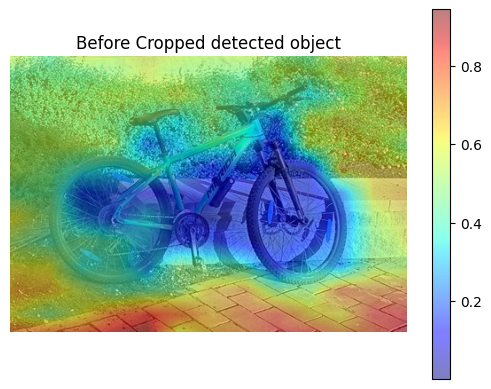

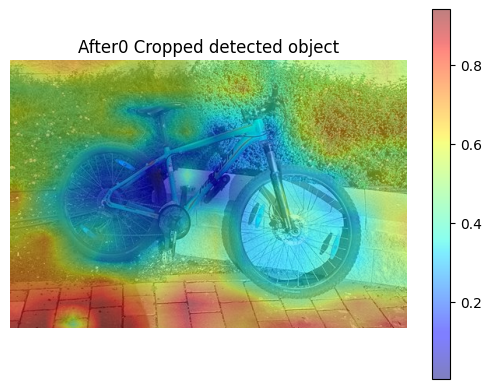

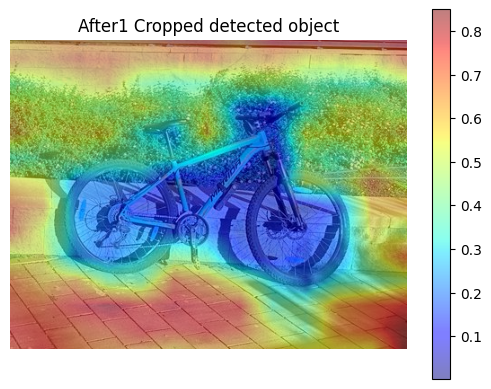

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/1/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


/content/mast3r/dust3r/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/content/mast3r/dust3r/dust3r/model.py:205: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/mast3r/dust3r/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


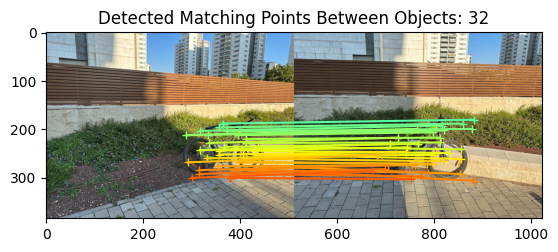

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/1/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


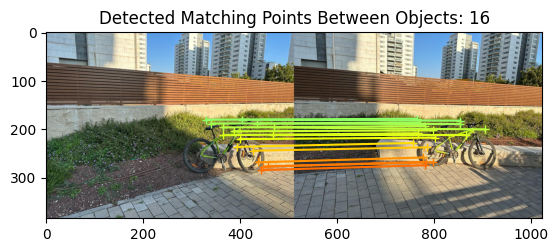

Object Movement Detected In Scene 1 ('after1')


'after1'

In [16]:
images_folder_path = '/content/drive/MyDrive/Matrix_DINO/changes_task_v2/1'
movement_model.load_scenes(images_folder_path, norm=True, plot_attn=False, plot_ROI=True)
movement_model.detect_movement()

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/2/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


/content/mast3r/dust3r/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/content/mast3r/dust3r/dust3r/model.py:205: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/mast3r/dust3r/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


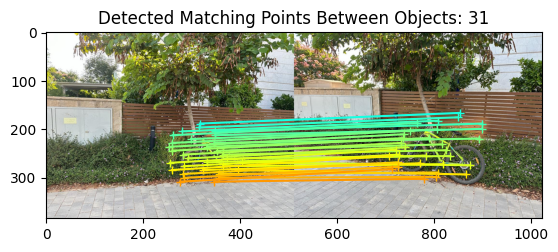

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/2/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


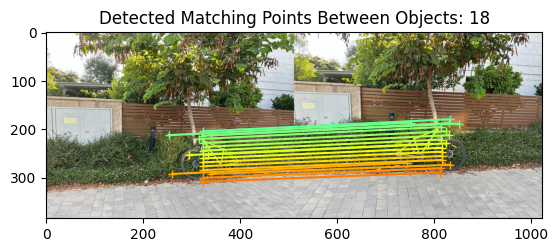

Object Movement Detected In Scene 1 ('after1')


'after1'

In [17]:
images_folder_path = '/content/drive/MyDrive/Matrix_DINO/changes_task_v2/2'
movement_model.load_scenes(images_folder_path, norm=True, plot_attn=False, plot_ROI=False)
movement_model.detect_movement()

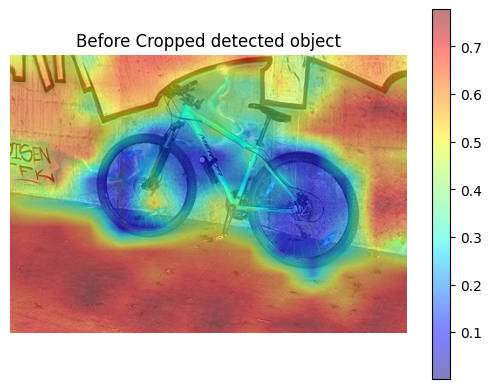

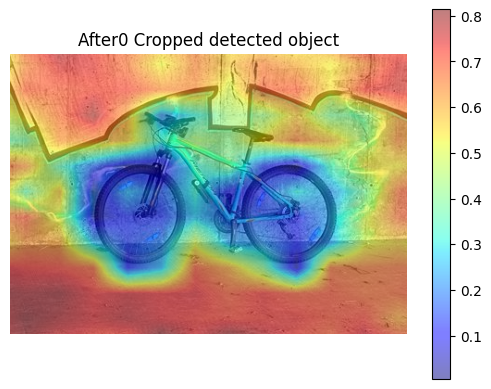

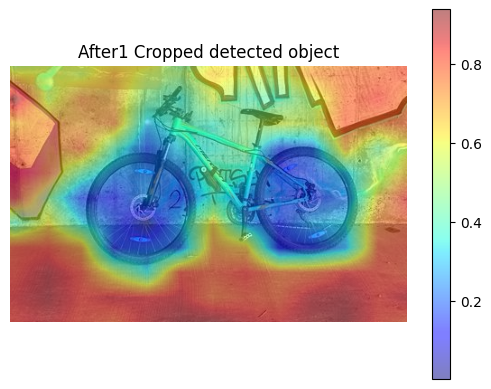

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/3/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


/content/mast3r/dust3r/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/content/mast3r/dust3r/dust3r/model.py:205: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/mast3r/dust3r/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


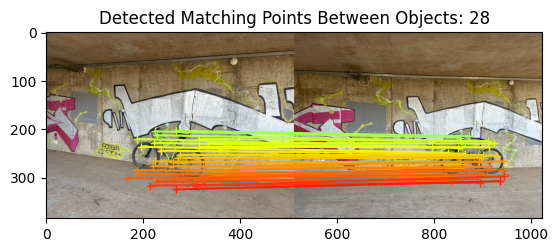

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/3/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


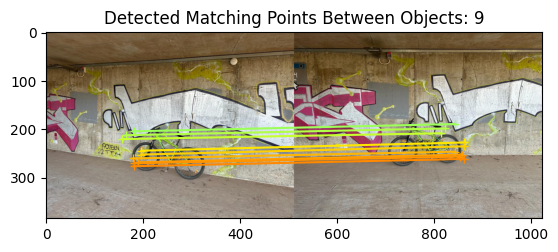

Object Movement Detected In Scene 1 ('after1')


'after1'

In [10]:
images_folder_path = '/content/drive/MyDrive/Matrix_DINO/changes_task_v2/3'
movement_model.load_scenes(images_folder_path, norm=True, plot_attn=False, plot_ROI=True)
movement_model.detect_movement()

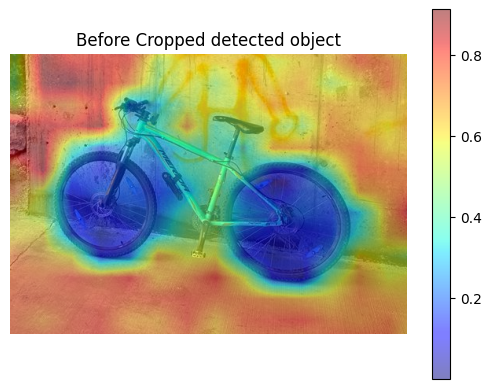

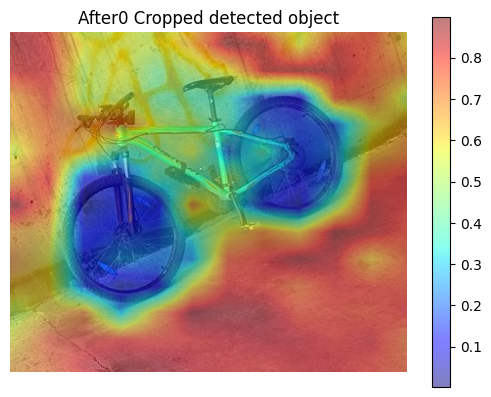

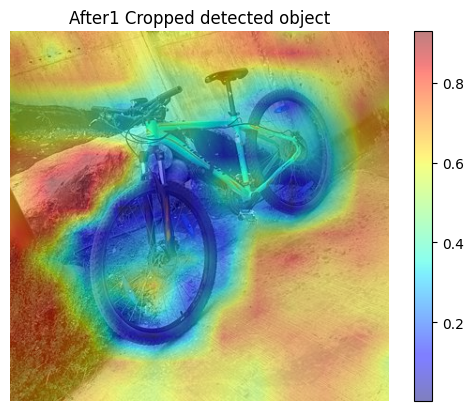

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/4/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/4/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


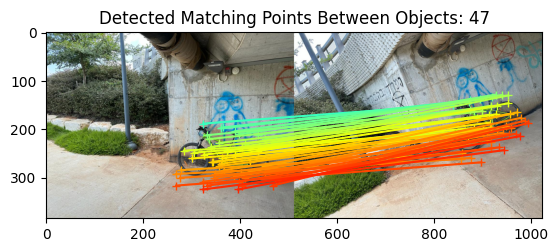

>> Loading a list of 2 images
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/4/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/drive/MyDrive/Matrix_DINO/changes_task_v2/4/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


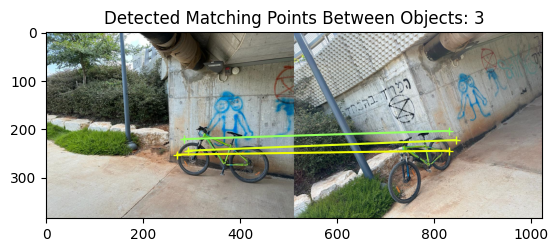

Object Movement Detected In Scene 1 ('after1')


'after1'

In [11]:
images_folder_path = '/content/drive/MyDrive/Matrix_DINO/changes_task_v2/4'
movement_model.load_scenes(images_folder_path, norm=True, plot_attn=False, plot_ROI=True)
movement_model.detect_movement()

# Examples (ROI and macthing points)

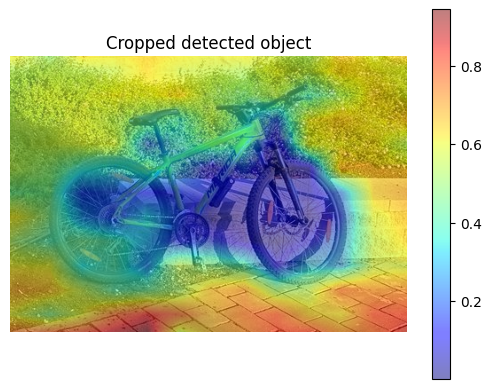

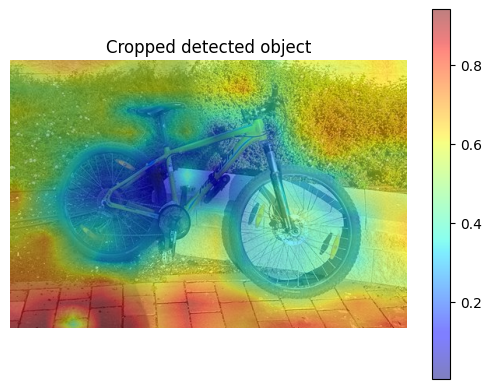

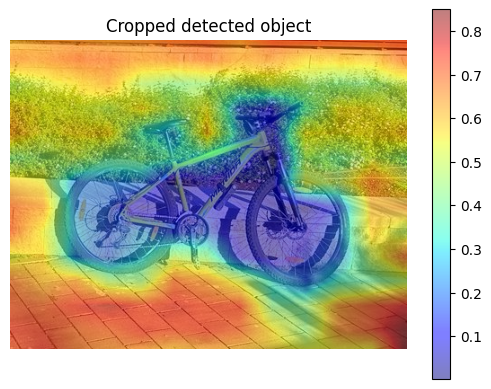

>> Loading a list of 2 images
 - adding /content/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/1/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


/content/mast3r/dust3r/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/content/mast3r/dust3r/dust3r/model.py:205: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/mast3r/dust3r/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


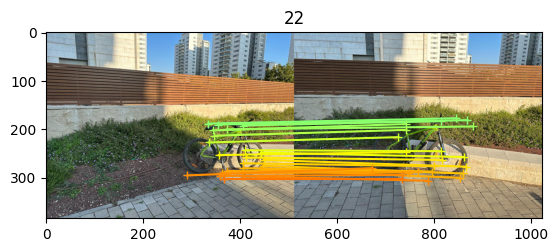

>> Loading a list of 2 images
 - adding /content/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/1/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


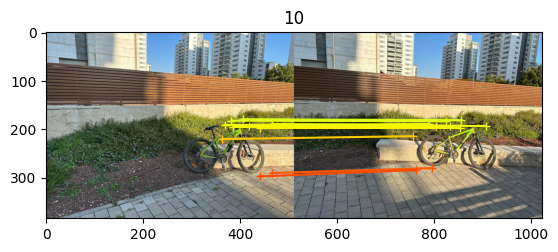

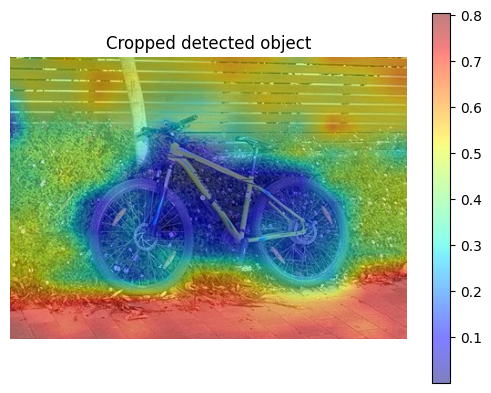

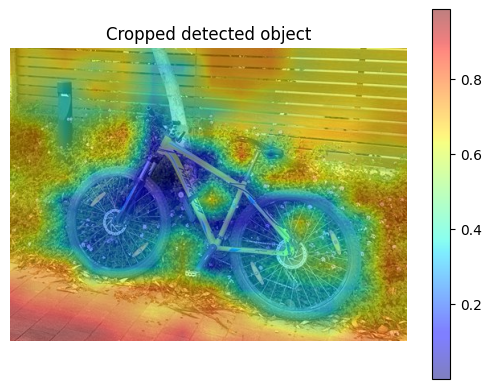

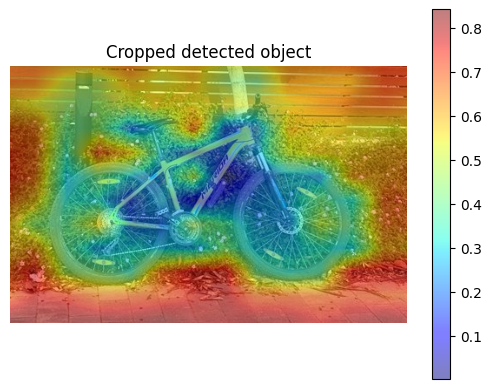

>> Loading a list of 2 images
 - adding /content/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/2/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


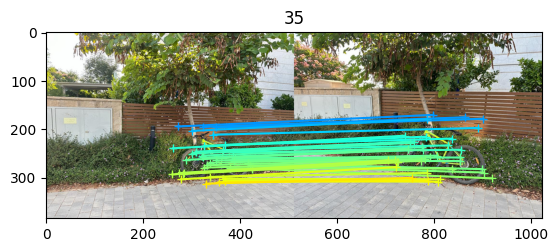

>> Loading a list of 2 images
 - adding /content/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/2/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


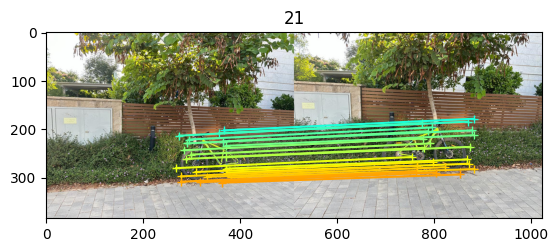

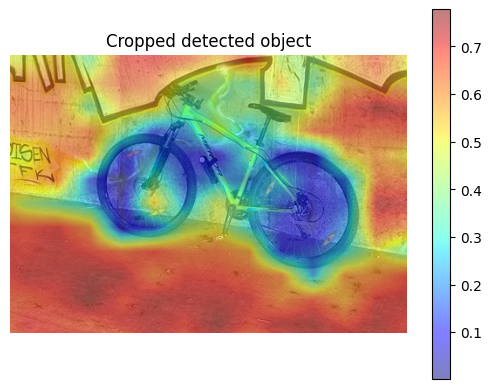

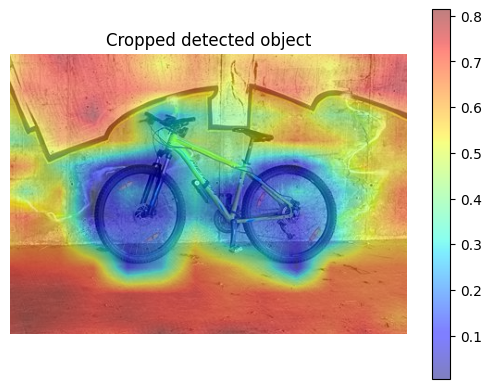

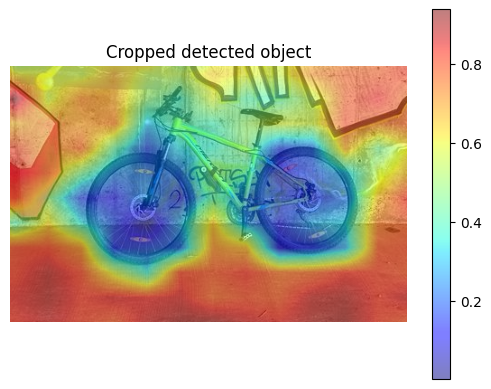

>> Loading a list of 2 images
 - adding /content/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/3/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


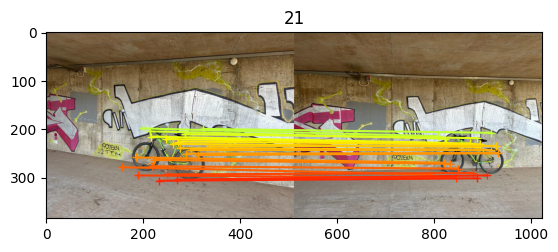

>> Loading a list of 2 images
 - adding /content/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/3/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


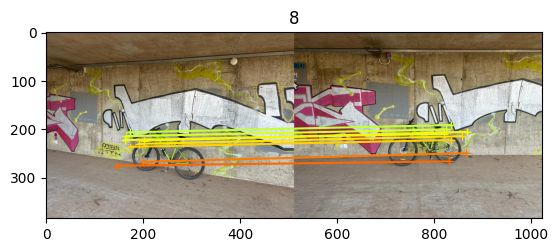

In [ ]:
import pdb
for test in range(1,5): #range(1,len(os.listdir(cfg['folder_path']))+1):

  images_path = os.path.join(folder_path, str(test))
  movement_model.initialize()
  for scene in ['before', 'after0', 'after1']:
    image_path = os.path.join('/',images_path, f'{scene}.jpeg')
    movement_model.append_scene_path(image_path)
    image = Image.open(image_path)
    img_transformed = movement_model.transform_input(image, norm=True)
    cls_token, attn_map = movement_model.run_dino(img_transformed)
    cls_attn = movement_model.cls_attention(image, attn_map, plot_attn=False)
    cropped_cls_attn, cropped_img = movement_model.crop_ROI(image, cls_attn, plot_ROI=False, padding=30)

  grid0 = movement_model.projection_grid(scene=0, plot_grid=False, plot_matches=True)
  grid1 = movement_model.projection_grid(scene=1, plot_grid=False, plot_matches=True)

  # result = movement_model.movement_score(grid0, grid1, before_path)
  # if result == 1:
  #   print("Object movement detected in 'after0' Scene")
  # else:
  #   print("Object movement detected in 'after1' Scene")


# Examples (including Grid)

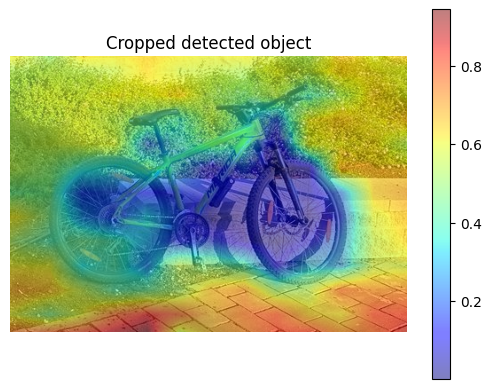

>> Loading a list of 2 images
 - adding /content/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/1/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


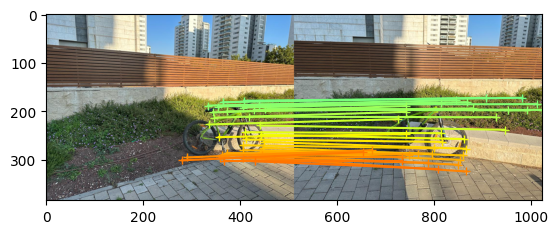

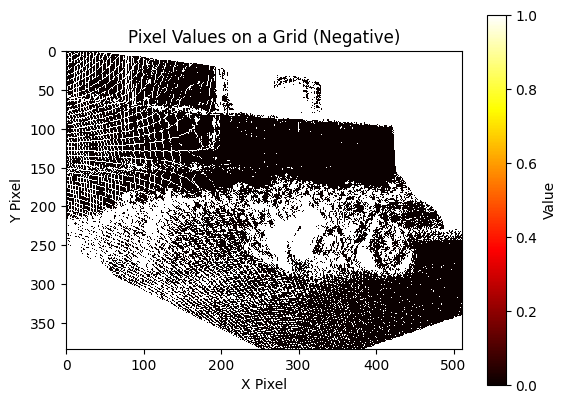

>> Loading a list of 2 images
 - adding /content/changes_task_v2/1/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/1/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


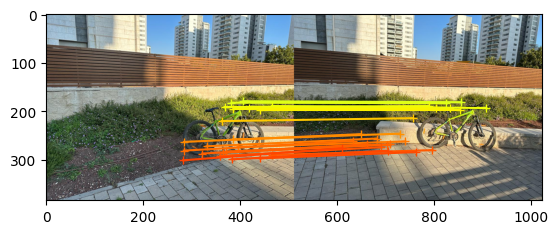

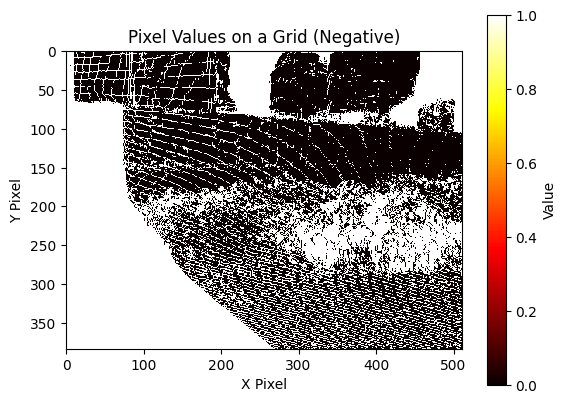

Object movement detected in 'after0' Scene


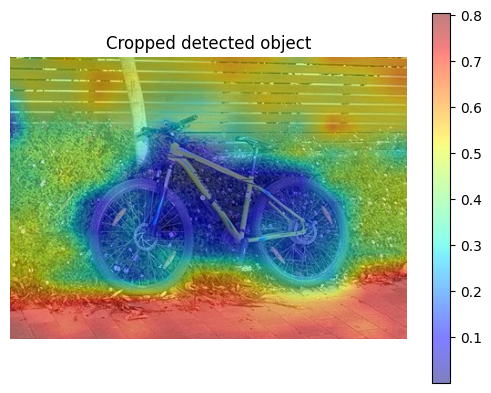

>> Loading a list of 2 images
 - adding /content/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/2/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


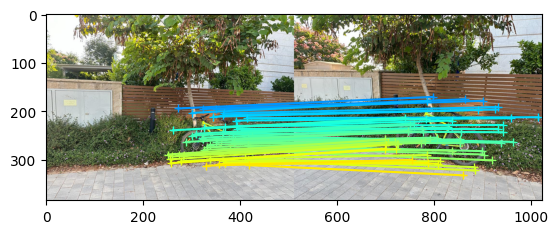

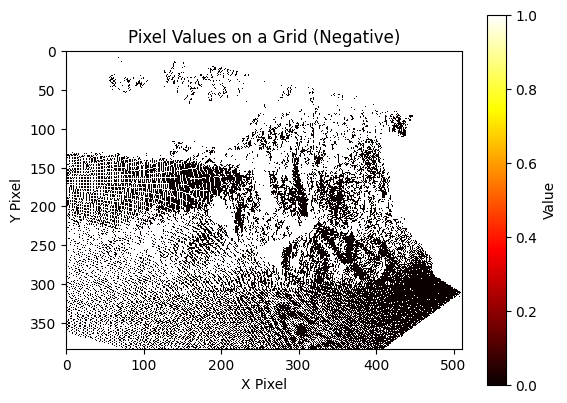

>> Loading a list of 2 images
 - adding /content/changes_task_v2/2/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/2/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


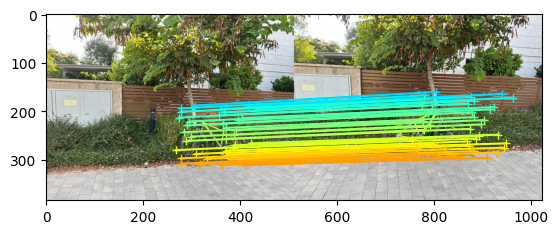

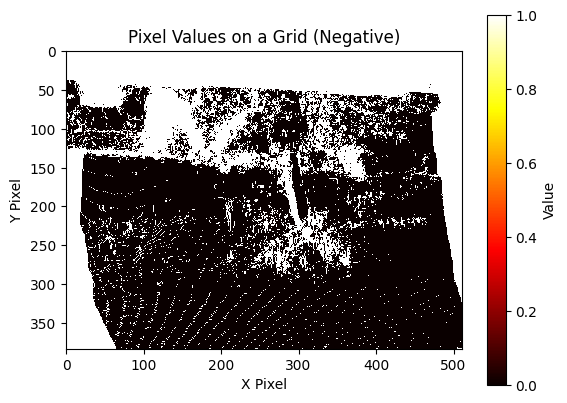

Object movement detected in 'after1' Scene


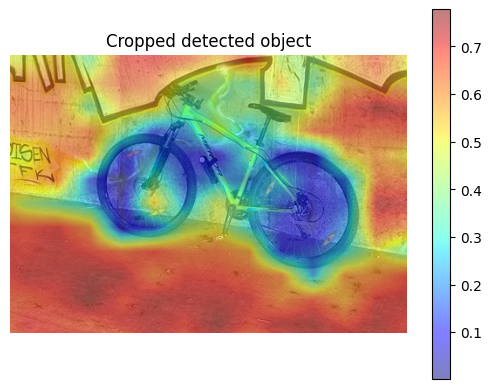

>> Loading a list of 2 images
 - adding /content/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/3/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


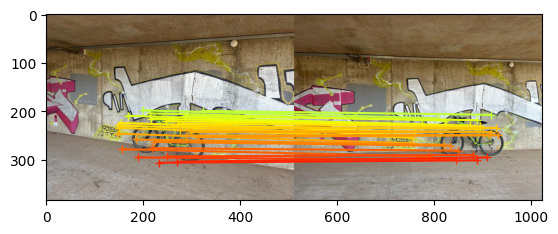

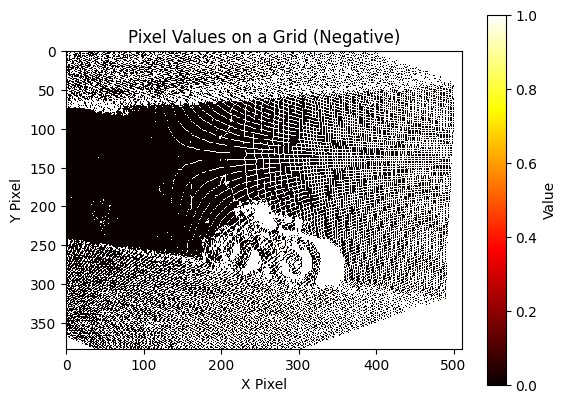

>> Loading a list of 2 images
 - adding /content/changes_task_v2/3/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/3/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


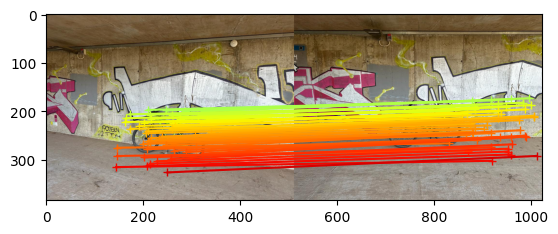

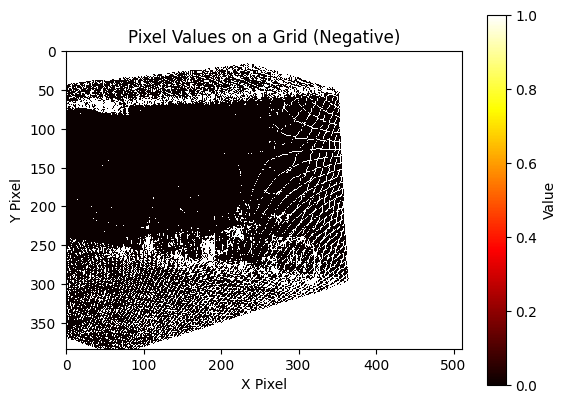

Object movement detected in 'after1' Scene


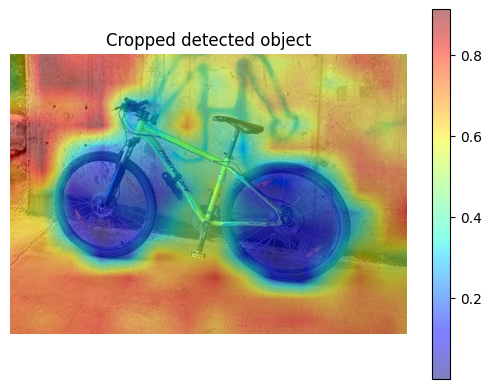

>> Loading a list of 2 images
 - adding /content/changes_task_v2/4/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/4/after0.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


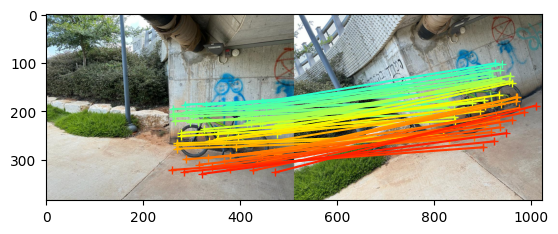

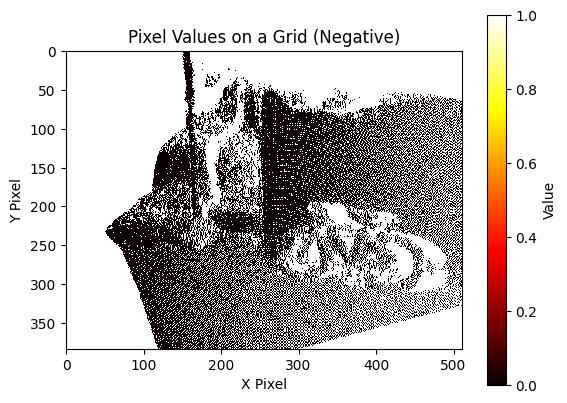

>> Loading a list of 2 images
 - adding /content/changes_task_v2/4/before.jpeg with resolution 1024x768 --> 512x384
 - adding /content/changes_task_v2/4/after1.jpeg with resolution 1024x768 --> 512x384
 (Found 2 images)


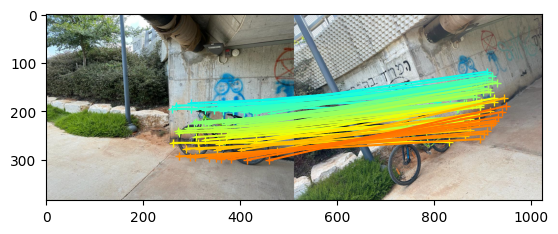

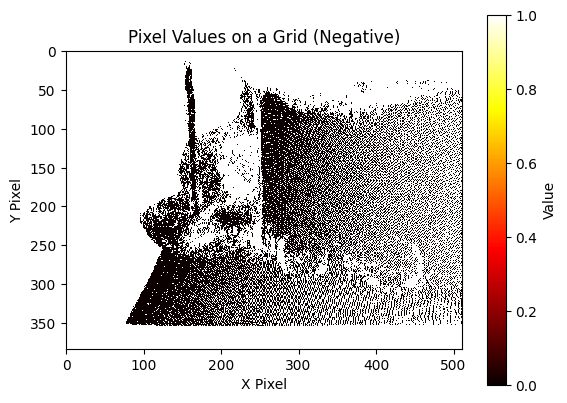

Object movement detected in 'after0' Scene


In [ ]:
import pdb
for test in range(1,5): #range(1,len(os.listdir(cfg['folder_path']))+1):

  images_path = os.path.join(folder_path, str(test))

  # Find object patch
  before_path = os.path.join('/',images_path, f'before.jpeg')
  before_img = Image.open(before_path)
  img_transformed = movement_model.transform_input(before_img, norm=True)
  cls_token, attn_map = movement_model.run_dino(img_transformed)
  cls_attn = movement_model.cls_attention(before_img, attn_map, plot_attn=False)
  cropped_cls_attn, cropped_img = movement_model.crop_ROI(before_img, cls_attn, plot_ROI=True, padding=30)

  # Obtain scene projection
  after0_path = os.path.join('/',images_path, f'after0.jpeg')
  after1_path = os.path.join('/',images_path, f'after1.jpeg')

  grid0 = movement_model.projection_grid(before_path, after0_path, plot_grid=True, plot_matches=True)
  grid1 = movement_model.projection_grid(before_path, after1_path, plot_grid=True, plot_matches=True)

  result = movement_model.movement_score(grid0, grid1, before_path)
  if result == 1:
    print("Object movement detected in 'after0' Scene")
  else:
    print("Object movement detected in 'after1' Scene")
